# Forecasting Net Prophet

You’re a growth analyst at [MercadoLibre](http://investor.mercadolibre.com/about-us). With over 200 million users, MercadoLibre is the most popular e-commerce site in Latin America. You've been tasked with analyzing the company's financial and user data in clever ways to make the company grow. So, you want to find out if the ability to predict search traffic can translate into the ability to successfully trade the stock.

The instructions for this Challenge are divided into four steps, as follows:

* Step 1: Find unusual patterns in hourly Google search traffic

* Step 2: Mine the search traffic data for seasonality

* Step 3: Relate the search traffic to stock price patterns

* Step 4: Create a time series model with Prophet

The following subsections detail these steps.

## Install and import the required libraries and dependencies

In [1]:
# Install the required libraries
!pip install prophet

In [37]:
# Import the required libraries and dependencies
import pandas as pd
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, add_changepoints_to_plot, plot_components
import datetime as dt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

## Step 1: Find Unusual Patterns in Hourly Google Search Traffic

The data science manager asks if the Google search traffic for the company links to any financial events at the company. Or, does the search traffic data just present random noise? To answer this question, pick out any unusual patterns in the Google search data for the company, and connect them to the corporate financial events.

To do so, complete the following steps:

1. Read the search data into a DataFrame, and then slice the data to just the month of May 2020. (During this month, MercadoLibre released its quarterly financial results.) Visualize the results. Do any unusual patterns exist?

2. Calculate the total search traffic for the month, and then compare the value to the monthly median across all months. Did the Google search traffic increase during the month that MercadoLibre released its financial results?


#### Step 1: Read the search data into a DataFrame, and then slice the data to just the month of May 2020. (During this month, MercadoLibre released its quarterly financial results.) Visualize the results. Do any unusual patterns exist?

In [3]:
# Store the data in a Pandas DataFrame
# Set the "Date" column as the Datetime Index.

df_mercado_trends = pd.read_csv(
    "https://static.bc-edx.com/ai/ail-v-1-0/m8/lms/datasets/google_hourly_search_trends.csv",
    index_col='Date', 
    parse_dates=True, 
    infer_datetime_format=True
).dropna()

# Review the first and last five rows of the DataFrame
display(df_mercado_trends.head())
display(df_mercado_trends.tail())

/var/folders/g3/c42f9hrj2zjcygj7ht932xnh0000gn/T/ipykernel_1174/1096498906.py:4: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df_mercado_trends = pd.read_csv(
/var/folders/g3/c42f9hrj2zjcygj7ht932xnh0000gn/T/ipykernel_1174/1096498906.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_mercado_trends = pd.read_csv(


,Search Trends
Date,
2016-06-01 00:00:00,97
2016-06-01 01:00:00,92
2016-06-01 02:00:00,76
2016-06-01 03:00:00,60
2016-06-01 04:00:00,38


,Search Trends
Date,
2020-09-07 20:00:00,71
2020-09-07 21:00:00,83
2020-09-07 22:00:00,96
2020-09-07 23:00:00,97
2020-09-08 00:00:00,96


In [4]:
# Review the data types of the DataFrame using the info function
df_mercado_trends.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 37106 entries, 2016-06-01 00:00:00 to 2020-09-08 00:00:00
Data columns (total 1 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   Search Trends  37106 non-null  int64
dtypes: int64(1)
memory usage: 579.8 KB


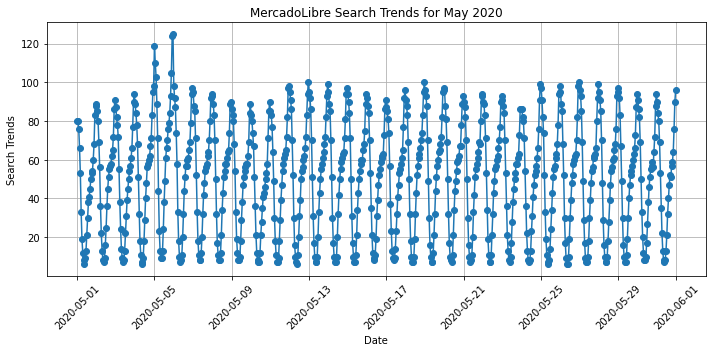

In [5]:
# Ensure your DataFrame's 'Date' column is set as the DateTimeIndex
df_mercado_trends.index = pd.to_datetime(df_mercado_trends.index)

# Slice the DataFrame to just the month of May 2020
may_2020_data = df_mercado_trends.loc['2020-05-01':'2020-05-31']

# Plot to visualize the data for May 2020
plt.figure(figsize=(10, 5))
plt.plot(may_2020_data.index, may_2020_data['Search Trends'], marker='o')
plt.title('MercadoLibre Search Trends for May 2020')
plt.xlabel('Date')
plt.ylabel('Search Trends')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()  # Adjusts plot to ensure everything fits without overlap
plt.show()


#### Step 2: Calculate the total search traffic for the month, and then compare the value to the monthly median across all months. Did the Google search traffic increase during the month that MercadoLibre released its financial results?

In [6]:
# Calculate the sum of the total search traffic for May 2020
traffic_may_2020 = may_2020_data['Search Trends'].sum()

# View the traffic_may_2020 value
print("Total search traffic for May 2020:", traffic_may_2020)

Total search traffic for May 2020: 38181


In [7]:
# Group the DataFrame by index year and month, sum the search traffic, then calculate the median across these sums
monthly_traffic = df_mercado_trends['Search Trends'].resample('M').sum()  # Sums up each month
median_monthly_traffic = monthly_traffic.median()

# View the median_monthly_traffic value
print("Median monthly search traffic:", median_monthly_traffic)


Median monthly search traffic: 35172.5


/var/folders/g3/c42f9hrj2zjcygj7ht932xnh0000gn/T/ipykernel_1174/2268142797.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_traffic = df_mercado_trends['Search Trends'].resample('M').sum()  # Sums up each month


In [8]:
# Calculate the comparison ratio of May 2020 traffic to the median monthly traffic
comparison_ratio = traffic_may_2020 / median_monthly_traffic

# Display the comparison ratio
print(f"May 2020 search traffic is {comparison_ratio: .2f} times the median monthly traffic.")


May 2020 search traffic is  1.09 times the median monthly traffic.


##### Answer the following question: 

**Question:** Did the Google search traffic increase during the month that MercadoLibre released its financial results?

**Answer:** Slightly, it seems it went up by 9%

## Step 2: Mine the Search Traffic Data for Seasonality

Marketing realizes that they can use the hourly search data, too. If they can track and predict interest in the company and its platform for any time of day, they can focus their marketing efforts around the times that have the most traffic. This will get a greater return on investment (ROI) from their marketing budget.

To that end, you want to mine the search traffic data for predictable seasonal patterns of interest in the company. To do so, complete the following steps:

1. Group the hourly search data to plot the average traffic by the hour of day. Does the search traffic peak at a particular time of day or is it relatively consistent?

2. Group the hourly search data to plot the average traffic by the day of the week (for example, Monday vs. Friday). Does the search traffic get busiest on any particular day of the week?

3. Group the hourly search data to plot the average traffic by the week of the year. Does the search traffic tend to increase during the winter holiday period (weeks 40 through 52)?


#### Step 1: Group the hourly search data to plot the average traffic by the hour of the day.

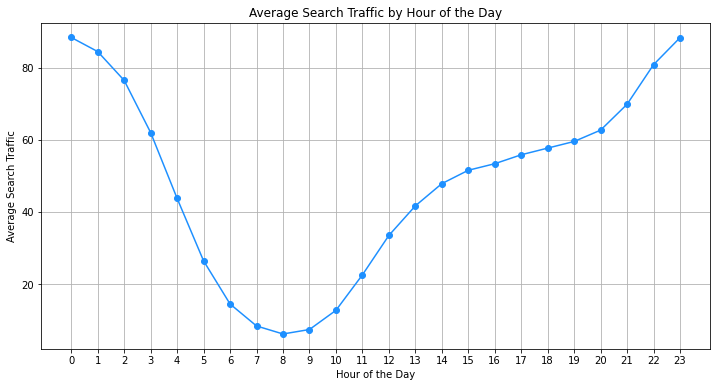

In [9]:
# Ensure your DataFrame's 'Date' column is set as the DateTimeIndex
df_mercado_trends.index = pd.to_datetime(df_mercado_trends.index)

# Group by hour of the day and calculate the mean search trends
average_hourly_traffic = df_mercado_trends['Search Trends'].groupby(df_mercado_trends.index.hour).mean()

# Plot the average hourly traffic using a line plot
plt.figure(figsize=(12, 6))
average_hourly_traffic.plot(kind='line', marker='o', linestyle='-', color='dodgerblue')
plt.title('Average Search Traffic by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Search Traffic')
plt.xticks(range(0, 24))  # Ensure all hours are marked from 0 to 23
plt.grid(True)
plt.show()


#### Step 2: Group the hourly search data to plot the average traffic by the day of the week (for example, Monday vs. Friday).

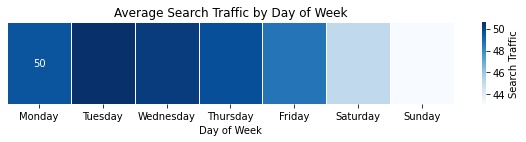

In [10]:
# Ensure your DataFrame's 'Date' column is set as the DateTimeIndex
df_mercado_trends.index = pd.to_datetime(df_mercado_trends.index)

# Group by day of the week and calculate the mean search trends
average_daily_traffic = df_mercado_trends['Search Trends'].groupby(df_mercado_trends.index.day_name()).mean()

# Sort the days to start from Monday to Sunday (optional, for better visualization)
sorter = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
average_daily_traffic = average_daily_traffic.reindex(sorter)

# Convert the series to a DataFrame for the heatmap
data_for_heatmap = average_daily_traffic.to_frame().T

# Create a heatmap to visualize average daily traffic
plt.figure(figsize=(10, 1.5))  # Adjust the figure size to fit the single row heatmap
sns.heatmap(data_for_heatmap, annot=True, fmt=".0f", linewidths=.5, cmap="Blues", cbar_kws={'label': 'Search Traffic'})
plt.title('Average Search Traffic by Day of Week')
plt.xlabel('Day of Week')
plt.yticks([])  # Hide y-axis labels for cleaner look since there's only one row
plt.show()

#### Step 3: Group the hourly search data to plot the average traffic by the week of the year.

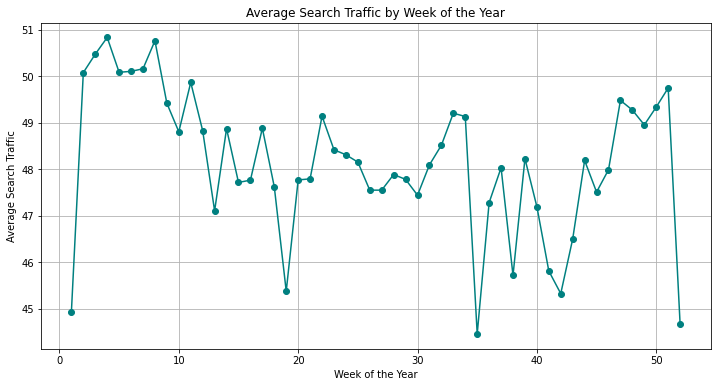

In [11]:
# Group by week of the year and calculate the mean search trends
average_weekly_traffic = df_mercado_trends['Search Trends'].groupby(df_mercado_trends.index.isocalendar().week).mean()

# Plot the average weekly traffic using a line plot
plt.figure(figsize=(12, 6))
average_weekly_traffic.plot(kind='line', marker='o', color='teal')
plt.title('Average Search Traffic by Week of the Year')
plt.xlabel('Week of the Year')
plt.ylabel('Average Search Traffic')
plt.grid(True)
plt.show()

##### Answer the following question:

**Question:** Are there any time based trends that you can see in the data?

**Answer:** There are two distinct low points, week 19 and week 35. On average, the third quarter leading into the fourth quarter seems lower.

## Step 3: Relate the Search Traffic to Stock Price Patterns

You mention your work on the search traffic data during a meeting with people in the finance group at the company. They want to know if any relationship between the search data and the company stock price exists, and they ask if you can investigate.

To do so, complete the following steps:

1. Read in and plot the stock price data. Concatenate the stock price data to the search data in a single DataFrame.

2. Market events emerged during the year of 2020 that many companies found difficult. But, after the initial shock to global financial markets, new customers and revenue increased for e-commerce platforms. Slice the data to just the first half of 2020 (`2020-01` to `2020-06` in the DataFrame), and then plot the data. Do both time series indicate a common trend that’s consistent with this narrative?

3. Create a new column in the DataFrame named “Lagged Search Trends” that offsets, or shifts, the search traffic by one hour. Create two additional columns:

    * “Stock Volatility”, which holds an exponentially weighted four-hour rolling average of the company’s stock volatility

    * “Hourly Stock Return”, which holds the percent change of the company's stock price on an hourly basis

4. Review the time series correlation, and then answer the following question: Does a predictable relationship exist between the lagged search traffic and the stock volatility or between the lagged search traffic and the stock price returns?


#### Step 1: Read in and plot the stock price data. Concatenate the stock price data to the search data in a single DataFrame.

In [12]:
# Upload the "mercado_stock_price.csv" file into Colab, then store in a Pandas DataFrame
# Set the "date" column as the Datetime Index.
df_mercado_stock = pd.read_csv(
    "https://static.bc-edx.com/ai/ail-v-1-0/m8/lms/datasets/mercado_stock_price.csv",
    index_col="date",
    parse_dates=True, 
    infer_datetime_format=True
).dropna()

# View the first and last five rows of the DataFrame
display(df_mercado_stock.head())
display(df_mercado_stock.tail())

/var/folders/g3/c42f9hrj2zjcygj7ht932xnh0000gn/T/ipykernel_1174/880024568.py:3: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df_mercado_stock = pd.read_csv(


,close
date,
2015-01-02 09:00:00,127.67
2015-01-02 10:00:00,125.44
2015-01-02 11:00:00,125.57
2015-01-02 12:00:00,125.40
2015-01-02 13:00:00,125.17


,close
date,
2020-07-31 11:00:00,1105.780
2020-07-31 12:00:00,1087.925
2020-07-31 13:00:00,1095.800
2020-07-31 14:00:00,1110.650
2020-07-31 15:00:00,1122.510


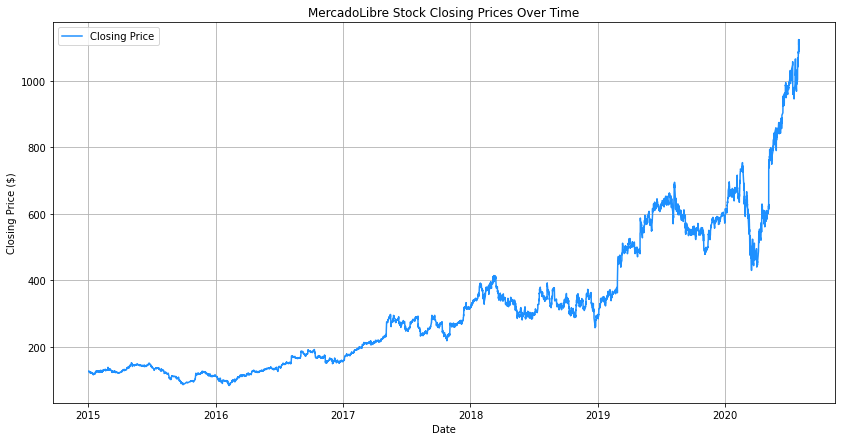

In [13]:
# Plot the closing prices
import matplotlib.pyplot as plt

# Plot the closing prices of the stock
plt.figure(figsize=(14, 7))  # Set the figure size for better readability
plt.plot(df_mercado_stock.index, df_mercado_stock['close'], label='Closing Price', color='dodgerblue')
plt.title('MercadoLibre Stock Closing Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Price ($)')
plt.legend()
plt.grid(True)
plt.show()



In [14]:
# Concatenate the df_mercado_stock DataFrame with the df_mercado_trends DataFrame
# Concatenate the DataFrame by columns (axis=1), and drop and rows with only one column of data
combined_df = pd.concat([df_mercado_stock, df_mercado_trends], axis=1, join='inner')

# View the first and last five rows of the DataFrame
display(combined_df.head())
display(combined_df.tail())


,close,Search Trends
2016-06-01 09:00:00,135.16,6
2016-06-01 10:00:00,136.63,12
2016-06-01 11:00:00,136.56,22
2016-06-01 12:00:00,136.42,33
2016-06-01 13:00:00,136.10,40


,close,Search Trends
2020-07-31 11:00:00,1105.780,20
2020-07-31 12:00:00,1087.925,32
2020-07-31 13:00:00,1095.800,41
2020-07-31 14:00:00,1110.650,47
2020-07-31 15:00:00,1122.510,53


#### Step 2: Market events emerged during the year of 2020 that many companies found difficult. But, after the initial shock to global financial markets, new customers and revenue increased for e-commerce platforms. Slice the data to just the first half of 2020 (`2020-01` to `2020-06` in the DataFrame), and then plot the data. Do both time series indicate a common trend that’s consistent with this narrative?

In [15]:
# For the combined dataframe, slice to just the first half of 2020 (2020-01 through 2020-06) 
first_half_2020 = combined_df['2020-01-01':'2020-06-30']

# View the first and last five rows of first_half_2020 DataFrame
display(first_half_2020.head())
display(first_half_2020.tail())

,close,Search Trends
2020-01-02 09:00:00,601.085,9
2020-01-02 10:00:00,601.290,14
2020-01-02 11:00:00,615.410,25
2020-01-02 12:00:00,611.400,37
2020-01-02 13:00:00,611.830,50


,close,Search Trends
2020-06-30 11:00:00,976.17,17
2020-06-30 12:00:00,977.50,27
2020-06-30 13:00:00,973.23,37
2020-06-30 14:00:00,976.50,45
2020-06-30 15:00:00,984.93,51


<Figure size 1008x720 with 0 Axes>

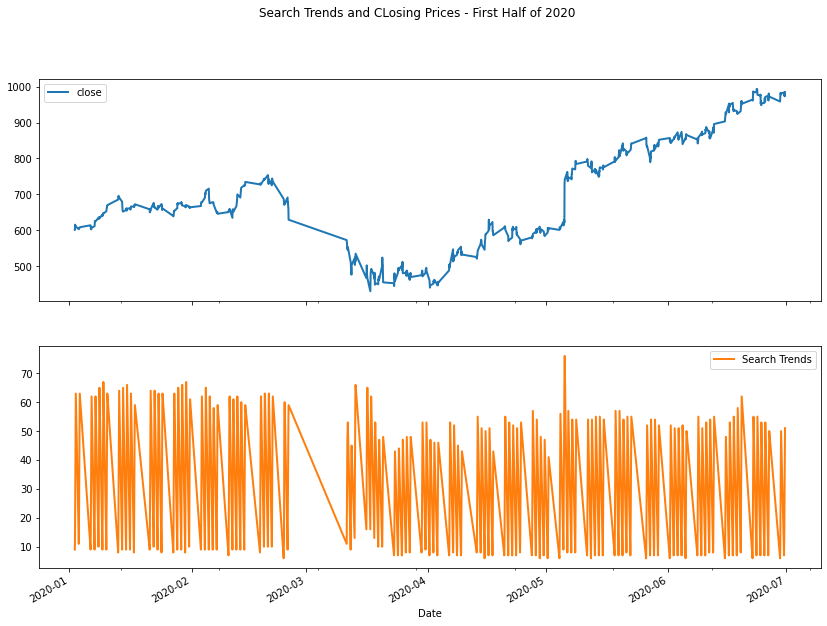

In [16]:
# Visualize the close and Search Trends data
# Plot each column on a separate axes using the following syntax
# `plot(subplots=True)`
plt.figure(figsize=(14,10))
first_half_2020.plot(subplots=True, figsize=(14,10), linewidth=2, title='Search Trends and CLosing Prices - First Half of 2020')
plt.xlabel('Date')
plt.show()

##### Answer the following question:

**Question:** Do both time series indicate a common trend that’s consistent with this narrative?

**Answer:** In truth, our evidence of a common trend between search activity and stock price is pretty limited. It does appear generally however that the low point for Mercado Libre's stock price, late March to early April, did coincide with lower search activity for the firm. Search activity does pick up along with its stock price, although the stock price from mid-April onward definitively outpaces search interest.

There's one important thing to note: if you zoom in both graphs to the spike around May 5th, 2020, you'll find the date of the company's earnings release to the public. It looks like search traffic for the firm spiked about two hours before the firm's stock price spiked. This could indicate a predictable pattern (can Google Searches predict the stock price?), but an alternative explanation might just be that people tend to search for more information about the firm right before an earnings announcement gets released. We'd need to do a little more time-series research to see which explanation best fits the data.

#### Step 3: Create a new column in the DataFrame named “Lagged Search Trends” that offsets, or shifts, the search traffic by one hour. Create two additional columns:

* “Stock Volatility”, which holds an exponentially weighted four-hour rolling average of the company’s stock volatility

* “Hourly Stock Return”, which holds the percent change of the company's stock price on an hourly basis


In [17]:
# Create a new column in the mercado_stock_trends_df DataFrame called Lagged Search Trends (I believe we should be working with the combined DF? Is this an error?)
# This column should shift the Search Trends information by one hour

# Rename combined_df to mercado_stock_trends_df for clarity in usage moving forward
mercado_stock_trends_df = combined_df

# Create a new column 'Lagged Search Trends' by shifting 'Search Trends' data by one hour
mercado_stock_trends_df['Lagged Search Trends'] = mercado_stock_trends_df['Search Trends'].shift(1)

# Display the DataFrame to verify the new column
display(mercado_stock_trends_df.head())

,close,Search Trends,Lagged Search Trends
2016-06-01 09:00:00,135.16,6,NaN
2016-06-01 10:00:00,136.63,12,6.0
2016-06-01 11:00:00,136.56,22,12.0
2016-06-01 12:00:00,136.42,33,22.0
2016-06-01 13:00:00,136.10,40,33.0


In [18]:
# Create a new column in the mercado_stock_trends_df DataFrame called Stock Volatility
# This column should calculate the standard deviation of the closing stock price return data over a 4 period rolling window

# Calculate hourly returns of the stock price
mercado_stock_trends_df['Hourly Stock Return'] = mercado_stock_trends_df['close'].pct_change()

# Calculate the rolling standard deviation of these returns over a 4-hour window to measure volatility
mercado_stock_trends_df["Stock Volatility"] = mercado_stock_trends_df["Hourly Stock Return"].rolling(window=4).std()

# Displayin' that sweet, sweet data in the DataFrame
display(mercado_stock_trends_df.head())

,close,Search Trends,Lagged Search Trends,Hourly Stock Return,Stock Volatility
2016-06-01 09:00:00,135.16,6,NaN,NaN,NaN
2016-06-01 10:00:00,136.63,12,6.0,0.010876,NaN
2016-06-01 11:00:00,136.56,22,12.0,-0.000512,NaN
2016-06-01 12:00:00,136.42,33,22.0,-0.001025,NaN
2016-06-01 13:00:00,136.10,40,33.0,-0.002346,0.006134


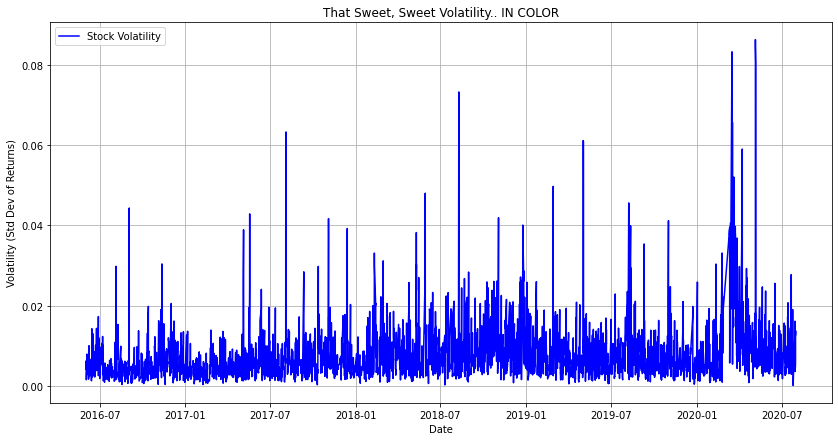

In [19]:
# Visualize the stock volatility

plt.figure(figsize=(14,7))
plt.plot(mercado_stock_trends_df.index, mercado_stock_trends_df['Stock Volatility'], label='Stock Volatility', color='blue')
plt.title('That Sweet, Sweet Volatility.. IN COLOR')
plt.xlabel('Date')
plt.ylabel('Volatility (Std Dev of Returns)')
plt.legend()
plt.grid(True)
plt.show()


**Solution Note:** Note how volatility spiked, and tended to stay high, during the first half of 2020. This is a common characteristic of volatility in stock returns worldwide: high volatility days tend to be followed by yet more high volatility days. When it rains, it pours.

In [20]:
# Create a new column in the mercado_stock_trends_df DataFrame called Hourly Stock Return
# This column should calculate hourly return percentage of the closing price

# I did this above to better calculate volatility. This section kind of seems like a mess.

# mercado_stock_trends_df['Hourly Stock Returns'] = mercado_stock_trends_df['close'].pct_change()

# A lil' verification goes a long way..
display(mercado_stock_trends_df)


,close,Search Trends,Lagged Search Trends,Hourly Stock Return,Stock Volatility
2016-06-01 09:00:00,135.160,6,NaN,NaN,NaN
2016-06-01 10:00:00,136.630,12,6.0,0.010876,NaN
2016-06-01 11:00:00,136.560,22,12.0,-0.000512,NaN
2016-06-01 12:00:00,136.420,33,22.0,-0.001025,NaN
2016-06-01 13:00:00,136.100,40,33.0,-0.002346,0.006134
...,...,...,...,...,...
2020-07-31 11:00:00,1105.780,20,11.0,0.006380,0.012837
2020-07-31 12:00:00,1087.925,32,20.0,-0.016147,0.013549
2020-07-31 13:00:00,1095.800,41,32.0,0.007239,0.013295
2020-07-31 14:00:00,1110.650,47,41.0,0.013552,0.013001


In [21]:
# View the first and last five rows of the mercado_stock_trends_df DataFrame
display(mercado_stock_trends_df.head())
display(mercado_stock_trends_df.tail())

,close,Search Trends,Lagged Search Trends,Hourly Stock Return,Stock Volatility
2016-06-01 09:00:00,135.16,6,NaN,NaN,NaN
2016-06-01 10:00:00,136.63,12,6.0,0.010876,NaN
2016-06-01 11:00:00,136.56,22,12.0,-0.000512,NaN
2016-06-01 12:00:00,136.42,33,22.0,-0.001025,NaN
2016-06-01 13:00:00,136.10,40,33.0,-0.002346,0.006134


,close,Search Trends,Lagged Search Trends,Hourly Stock Return,Stock Volatility
2020-07-31 11:00:00,1105.780,20,11.0,0.006380,0.012837
2020-07-31 12:00:00,1087.925,32,20.0,-0.016147,0.013549
2020-07-31 13:00:00,1095.800,41,32.0,0.007239,0.013295
2020-07-31 14:00:00,1110.650,47,41.0,0.013552,0.013001
2020-07-31 15:00:00,1122.510,53,47.0,0.010678,0.013566


#### Step 4: Review the time series correlation, and then answer the following question: Does a predictable relationship exist between the lagged search traffic and the stock volatility or between the lagged search traffic and the stock price returns?

In [22]:
# Construct correlation table of Stock Volatility, Lagged Search Trends, and Hourly Stock Return

# Grabbing the columns of interest
columns_of_interest = mercado_stock_trends_df[['Stock Volatility', 'Lagged Search Trends', 'Hourly Stock Return']]

# Calculating the correlation matrix
correlation_table = columns_of_interest.corr()

# Displaying 'dat table
display(correlation_table)

,Stock Volatility,Lagged Search Trends,Hourly Stock Return
Stock Volatility,1.000000,-0.148938,0.061424
Lagged Search Trends,-0.148938,1.000000,0.017929
Hourly Stock Return,0.061424,0.017929,1.000000


##### Answer the following question:


**Question:** Does a predictable relationship exist between the lagged search traffic and the stock volatility or between the lagged search traffic and the stock price returns?

**Answer:** Given the very weak correlation coefficients presented in the correlation table, there does not appear to be a predictable relationship between lagged search traffic and stock volatility or between lagged search traffic and stock price returns. The correlations are close to zero, suggesting that movements in search trends (even when lagged by an hour) do not meaningfully predict changes in stock volatility or returns within this dataset.

This lack of a strong predictable relationship could be due to several factors, including the possibility that search trends and stock movements are influenced by a multitude of external variables not captured merely by these two metrics. Additionally, the lag of one hour might not be the optimal time frame to capture interactions between these variables, or perhaps the true dynamics involve non-linear relationships that are not captured by Pearson correlation coefficients. Further analysis using different time lags, more sophisticated statistical or machine learning models, and the inclusion of other potentially influential variables might provide deeper insights.

## Step 4: Create a Time Series Model with Prophet

Now, you need to produce a time series model that analyzes and forecasts patterns in the hourly search data. To do so, complete the following steps:

1. Set up the Google search data for a Prophet forecasting model.

2. After estimating the model, plot the forecast. How's the near-term forecast for the popularity of MercadoLibre?

3. Plot the individual time series components of the model to answer the following questions:

    * What time of day exhibits the greatest popularity?

    * Which day of the week gets the most search traffic?

    * What's the lowest point for search traffic in the calendar year?


#### Step 1: Set up the Google search data for a Prophet forecasting model.

In [23]:
# Using the df_mercado_trends DataFrame, reset the index so the date information is no longer the index
df_reset = df_mercado_trends.reset_index()

# Label the columns ds and y so that the syntax is recognized by Prophet
mercado_prophet_df = df_reset.rename(columns={'Date': 'ds', 'Search Trends': 'y'})

# Drop an NaN values from the prophet_df DataFrame
mercado_prophet_df = mercado_prophet_df.dropna()

# View the first and last five rows of the mercado_prophet_df DataFrame
display(mercado_prophet_df.head())
display(mercado_prophet_df.tail())

,ds,y
0,2016-06-01 00:00:00,97
1,2016-06-01 01:00:00,92
2,2016-06-01 02:00:00,76
3,2016-06-01 03:00:00,60
4,2016-06-01 04:00:00,38


,ds,y
37101,2020-09-07 20:00:00,71
37102,2020-09-07 21:00:00,83
37103,2020-09-07 22:00:00,96
37104,2020-09-07 23:00:00,97
37105,2020-09-08 00:00:00,96


In [24]:
# Call the Prophet function, store as an object
model = Prophet()
print(model)

In [25]:
# Fit the time-series model.
model.fit(mercado_prophet_df)

09:42:46 - cmdstanpy - INFO - Chain [1] start processing
09:43:09 - cmdstanpy - INFO - Chain [1] done processing


In [26]:
# Create a future dataframe to hold predictions
# Make the prediction go out as far as 2000 hours (approx 80 days)
future_mercado_trends = model.make_future_dataframe(periods=2000, freq='h')

# View the last five rows of the future_mercado_trends DataFrame
display(future_mercado_trends.tail())

,ds
39101,2020-11-30 04:00:00
39102,2020-11-30 05:00:00
39103,2020-11-30 06:00:00
39104,2020-11-30 07:00:00
39105,2020-11-30 08:00:00


In [27]:
# Make the predictions for the trend data using the future_mercado_trends DataFrame
forecast_mercado_trends = model.predict(future_mercado_trends)

# Display the first five rows of the forecast_mercado_trends DataFrame
display(forecast_mercado_trends.head())

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-06-01 00:00:00,44.275375,81.291806,98.705753,44.275375,44.275375,45.309572,45.309572,45.309572,41.452721,...,1.860328,1.860328,1.860328,1.996523,1.996523,1.996523,0.0,0.0,0.0,89.584947
1,2016-06-01 01:00:00,44.276378,77.913779,94.867303,44.276378,44.276378,41.755341,41.755341,41.755341,37.943520,...,1.810240,1.810240,1.810240,2.001582,2.001582,2.001582,0.0,0.0,0.0,86.031720
2,2016-06-01 02:00:00,44.277382,67.416796,83.627650,44.277382,44.277382,31.431828,31.431828,31.431828,27.656558,...,1.768661,1.768661,1.768661,2.006609,2.006609,2.006609,0.0,0.0,0.0,75.709210
3,2016-06-01 03:00:00,44.278385,52.477346,68.809422,44.278385,44.278385,16.164591,16.164591,16.164591,12.417303,...,1.735683,1.735683,1.735683,2.011605,2.011605,2.011605,0.0,0.0,0.0,60.442977
4,2016-06-01 04:00:00,44.279389,34.815821,52.477552,44.279389,44.279389,-0.950297,-0.950297,-0.950297,-4.678130,...,1.711263,1.711263,1.711263,2.016569,2.016569,2.016569,0.0,0.0,0.0,43.329091


#### Step 2: After estimating the model, plot the forecast. How's the near-term forecast for the popularity of MercadoLibre?

In [30]:
# Plot the Prophet predictions for the Mercado trends data
fig = plot_plotly(model, forecast_mercado_trends)
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:107: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


##### Answer the following question:

**Question:**  How's the near-term forecast for the popularity of MercadoLibre?

**Answer:** Outlook stable, with a slight dip and rebound


#### Step 3: Plot the individual time series components of the model to answer the following questions:

* What time of day exhibits the greatest popularity?

* Which day of the week gets the most search traffic?

* What's the lowest point for search traffic in the calendar year?


In [31]:
# Set the index in the forecast_mercado_trends DataFrame to the ds datetime column
forecast_mercado_trends.set_index('ds', inplace=True)

# View the only the yhat,yhat_lower and yhat_upper columns from the DataFrame
display(forecast_mercado_trends[['yhat', 'yhat_lower', 'yhat_upper']].head())


,yhat,yhat_lower,yhat_upper
ds,,,
2016-06-01 00:00:00,89.584947,81.291806,98.705753
2016-06-01 01:00:00,86.031720,77.913779,94.867303
2016-06-01 02:00:00,75.709210,67.416796,83.627650
2016-06-01 03:00:00,60.442977,52.477346,68.809422
2016-06-01 04:00:00,43.329091,34.815821,52.477552


Solutions Note: `yhat` represents the most likely (average) forecast, whereas `yhat_lower` and `yhat_upper` represents the worst and best case prediction (based on what are known as 95% confidence intervals).

/var/folders/g3/c42f9hrj2zjcygj7ht932xnh0000gn/T/ipykernel_1174/1169100315.py:3: FutureWarning:

last is deprecated and will be removed in a future version. Please create a mask and filter using `.loc` instead



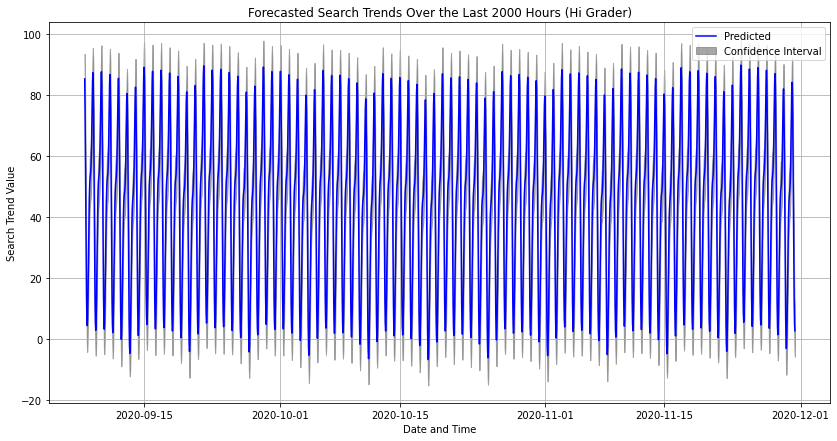

In [36]:
# From the forecast_mercado_trends DataFrame, plot the data to visualize
#  the yhat, yhat_lower, and yhat_upper columns over the last 2000 hours 
last_2000_hours = forecast_mercado_trends.last('2000h')

plt.figure(figsize=(14,7))
plt.plot(last_2000_hours.index, last_2000_hours['yhat'], label='Predicted', color='blue')
plt.fill_between(last_2000_hours.index, last_2000_hours['yhat_lower'], last_2000_hours['yhat_upper'], color='gray', alpha=0.7, label='Confidence Interval')
plt.title('Forecasted Search Trends Over the Last 2000 Hours (Hi Grader)')
plt.xlabel('Date and Time')
plt.ylabel('Search Trend Value')
plt.legend()
plt.grid(True)
plt.show()

/opt/anaconda3/lib/python3.9/site-packages/prophet/plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/prophet/plot.py:397: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/prophet/plot.py:401: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/prophet/plot.py:351: FutureWarning:


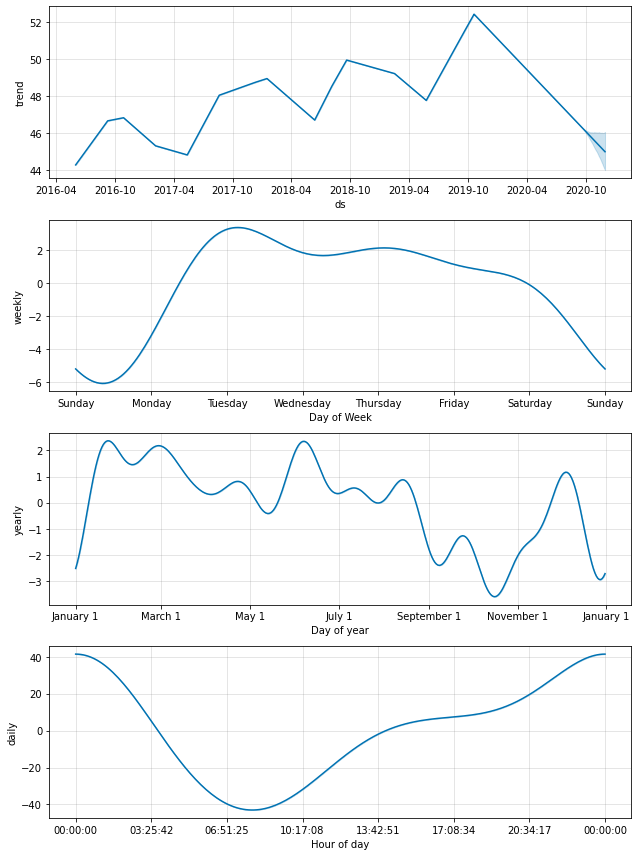

In [39]:
# Reset the index in the forecast_mercado_trends DataFrame
forecast_mercado_trends.reset_index(inplace=True)

# Use the plot_components function to visualize the forecast results 
# for the forecast_canada DataFrame (What the F is forecast_canada?!?! Again, I'm assuming this was an error)
fig_components = plot_components(model, forecast_mercado_trends)
plt.show()


##### Answer the following questions:

**Question:** What time of day exhibits the greatest popularity?

**Answer:** 

**Question:** Which day of week gets the most search traffic? 
   
**Answer:** 

**Question:** What's the lowest point for search traffic in the calendar year?

**Answer:** 
